## Imports

In [1]:
# visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from skimage import io
import os
# handle table-like data and matrices
import pandas as pd
import numpy as np
import os
import glob
import random
import tensorflow.keras.backend as kb
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

# model
from keras import backend as K
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.layers import *
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Model
from tensorflow.keras.models import load_model, save_model

## Load Data

In [2]:
Patients_Directory_Path = "../brain_data/kaggle_3m"
print(f"There are {len(os.listdir(Patients_Directory_Path))} total patients.\n")
Patients_Directory = os.listdir(Patients_Directory_Path)
Patients_Directory.sort()

There are 110 total patients.



In [3]:
print(Patients_Directory)

['TCGA_CS_4941_19960909', 'TCGA_CS_4942_19970222', 'TCGA_CS_4943_20000902', 'TCGA_CS_4944_20010208', 'TCGA_CS_5393_19990606', 'TCGA_CS_5395_19981004', 'TCGA_CS_5396_20010302', 'TCGA_CS_5397_20010315', 'TCGA_CS_6186_20000601', 'TCGA_CS_6188_20010812', 'TCGA_CS_6290_20000917', 'TCGA_CS_6665_20010817', 'TCGA_CS_6666_20011109', 'TCGA_CS_6667_20011105', 'TCGA_CS_6668_20011025', 'TCGA_CS_6669_20020102', 'TCGA_DU_5849_19950405', 'TCGA_DU_5851_19950428', 'TCGA_DU_5852_19950709', 'TCGA_DU_5853_19950823', 'TCGA_DU_5854_19951104', 'TCGA_DU_5855_19951217', 'TCGA_DU_5871_19941206', 'TCGA_DU_5872_19950223', 'TCGA_DU_5874_19950510', 'TCGA_DU_6399_19830416', 'TCGA_DU_6400_19830518', 'TCGA_DU_6401_19831001', 'TCGA_DU_6404_19850629', 'TCGA_DU_6405_19851005', 'TCGA_DU_6407_19860514', 'TCGA_DU_6408_19860521', 'TCGA_DU_7008_19830723', 'TCGA_DU_7010_19860307', 'TCGA_DU_7013_19860523', 'TCGA_DU_7014_19860618', 'TCGA_DU_7018_19911220', 'TCGA_DU_7019_19940908', 'TCGA_DU_7294_19890104', 'TCGA_DU_7298_19910324',

## Split Data into (train, val, test)

In [4]:
train_ratio=0.7
val_ratio=0.2
test_ratio=0.1

In [5]:
random.seed(1)


train_patients = random.sample(Patients_Directory, int(len(Patients_Directory)*train_ratio))

other_patients = list(np.setdiff1d(Patients_Directory,train_patients))
    
val_patients = random.sample(other_patients, int(len(Patients_Directory)*val_ratio))
    
test_patients = np.setdiff1d(other_patients,val_patients)

In [6]:
print(f"There are {len(train_patients)} train patients.\n")
print(f"There are {len(val_patients)} val patients.\n")
print(f"There are {len(test_patients)} test patients.\n")

There are 77 train patients.

There are 22 val patients.

There are 11 test patients.



## Train Data

In [7]:
train_images = []
train_masks = []
for patient in train_patients:
    patient_path = os.path.join(Patients_Directory_Path, patient)
    for filename in os.listdir(patient_path):
        f_path = os.path.join(patient_path, filename)
        if "mask" in filename:
            train_masks.append(f_path)
            
for i in train_masks:
    train_images.append(i.replace('_mask',''))            

In [8]:
print(len(train_images))
print(len(train_masks))

2784
2784


In [9]:
print(train_images[:4])
print(train_masks[:4])

['../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_10.tif', '../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_11.tif', '../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_12.tif', '../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_13.tif']
['../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_10_mask.tif', '../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_11_mask.tif', '../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_12_mask.tif', '../brain_data/kaggle_3m\\TCGA_DU_5851_19950428\\TCGA_DU_5851_19950428_13_mask.tif']


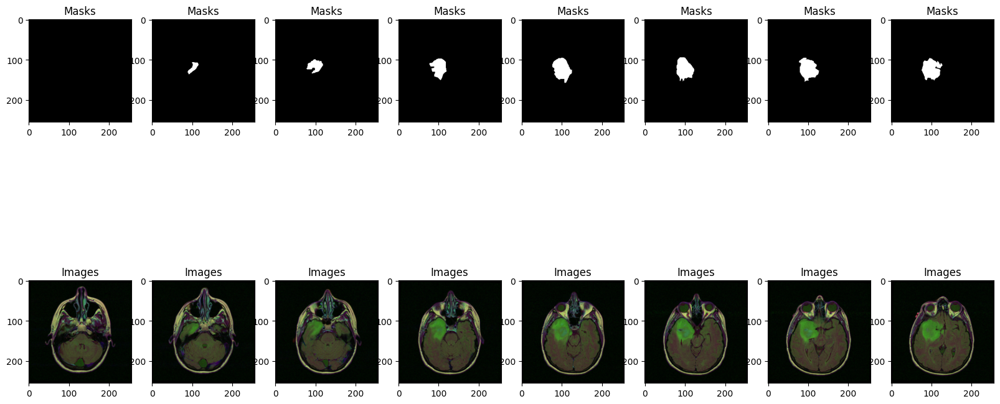

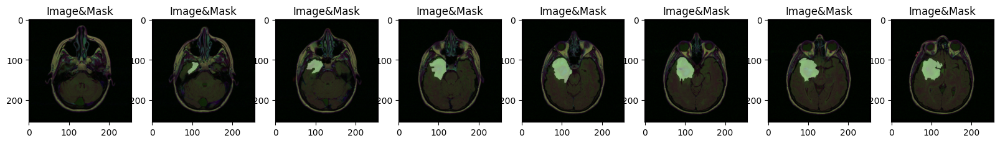

In [10]:
rows,cols=1,8
fig=plt.figure(figsize=(20,20))
for i in range(1,rows*cols+1):
    fig.add_subplot(rows+1,cols,i)
    msk_path=train_masks[i]
    msk=cv2.imread(msk_path)
    plt.title("Masks")
    plt.imshow(msk)
    fig.add_subplot(rows,cols,i)
    img_path=train_images[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)  
    plt.title("Images")
    plt.imshow(img)
plt.show()

rows,cols=1,8
fig=plt.figure(figsize=(20,20))
for i in range(1,rows*cols+1):
    fig.add_subplot(rows,cols,i)
    img_path=train_images[i]
    msk_path=train_masks[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    msk=cv2.imread(msk_path)
    plt.imshow(img)
    plt.imshow(msk,alpha=0.4)
    plt.title("Image&Mask")
plt.show()

## Validation Data

In [11]:
val_images = []
val_masks = []
for patient in val_patients:
    patient_path = os.path.join(Patients_Directory_Path, patient)
    for filename in os.listdir(patient_path):
        f_path = os.path.join(patient_path, filename)
        if "mask" in filename:
            val_masks.append(f_path)

for i in val_masks:
    val_images.append(i.replace('_mask',''))   

In [12]:
print(len(val_images))
print(len(val_masks))

727
727


In [13]:
print(val_images[:4])
print(val_masks[:4])

['../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_10.tif', '../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_11.tif', '../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_12.tif', '../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_13.tif']
['../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_10_mask.tif', '../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_11_mask.tif', '../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_12_mask.tif', '../brain_data/kaggle_3m\\TCGA_HT_7694_19950404\\TCGA_HT_7694_19950404_13_mask.tif']


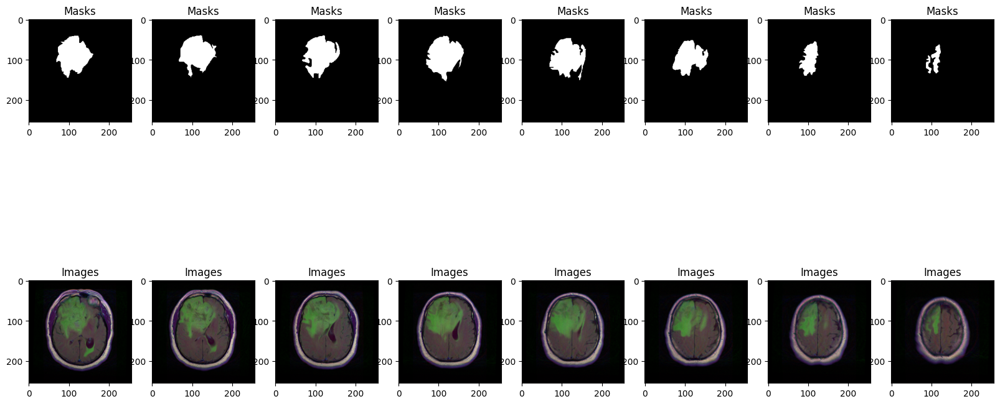

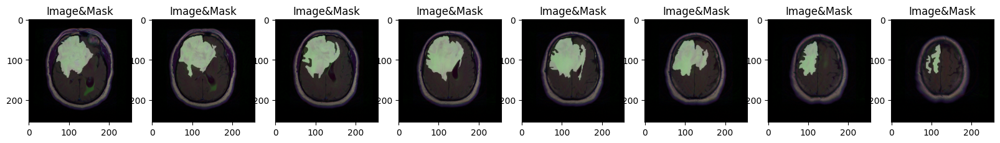

In [14]:
rows,cols=1,8
fig=plt.figure(figsize=(20,20))
for i in range(1,rows*cols+1):
    fig.add_subplot(rows+1,cols,i)
    msk_path=val_masks[i]
    msk=cv2.imread(msk_path)
    plt.title("Masks")
    plt.imshow(msk)
    fig.add_subplot(rows,cols,i)
    img_path=val_images[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)  
    plt.title("Images")
    plt.imshow(img)
plt.show()

rows,cols=1,8
fig=plt.figure(figsize=(20,20))
for i in range(1,rows*cols+1):
    fig.add_subplot(rows,cols,i)
    img_path=val_images[i]
    msk_path=val_masks[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    msk=cv2.imread(msk_path)
    plt.imshow(img)
    plt.imshow(msk,alpha=0.4)
    plt.title("Image&Mask")
plt.show()

## Test Data

In [15]:
test_images = []
test_masks = []
for patient in test_patients:
    patient_path = os.path.join(Patients_Directory_Path, patient)
    for filename in os.listdir(patient_path):
        f_path = os.path.join(patient_path, filename)
        if "mask" in filename:
            test_masks.append(f_path)

for i in test_masks:
    test_images.append(i.replace('_mask',''))               

In [16]:
print(len(test_images))
print(len(test_masks))

418
418


In [17]:
print(test_images[:4])
print(test_masks[:4])

['../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_10.tif', '../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_11.tif', '../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_12.tif', '../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_13.tif']
['../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_10_mask.tif', '../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_11_mask.tif', '../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_12_mask.tif', '../brain_data/kaggle_3m\\TCGA_CS_5395_19981004\\TCGA_CS_5395_19981004_13_mask.tif']


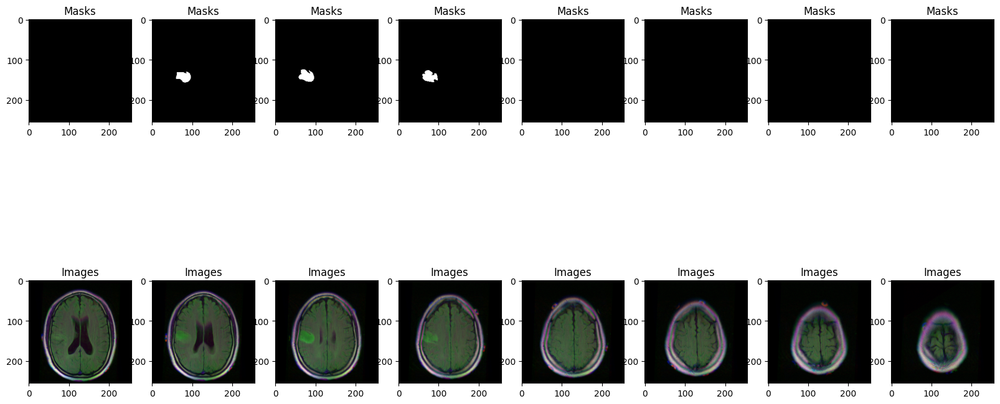

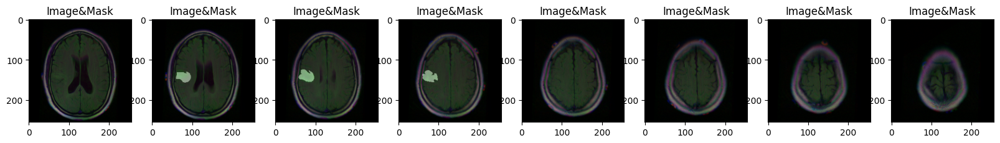

In [18]:
rows,cols=1,8
fig=plt.figure(figsize=(20,20))
for i in range(1,rows*cols+1):
    fig.add_subplot(rows+1,cols,i)
    msk_path=test_masks[i]
    msk=cv2.imread(msk_path)
    plt.title("Masks")
    plt.imshow(msk)
    fig.add_subplot(rows,cols,i)
    img_path=test_images[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)  
    plt.title("Images")
    plt.imshow(img)
plt.show()

rows,cols=1,8
fig=plt.figure(figsize=(20,20))
for i in range(1,rows*cols+1):
    fig.add_subplot(rows,cols,i)
    img_path=test_images[i]
    msk_path=test_masks[i]
    img=cv2.imread(img_path)
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    msk=cv2.imread(msk_path)
    plt.imshow(img)
    plt.imshow(msk,alpha=0.4)
    plt.title("Image&Mask")
plt.show()

## Creating DataFrames

In [19]:
df_train = pd.DataFrame(data={"filename": train_images, 'mask' : train_masks})
df_val = pd.DataFrame(data={"filename": val_images, 'mask' : val_masks})
df_test = pd.DataFrame(data={"filename": test_images, 'mask' : test_masks})

def positiv_negativ_diagnosis(mask_path):
    value = np.max(cv2.imread(mask_path))
    if value > 0 : return 1
    else: return 0

df_train["diagnosis"] = df_train["mask"].apply(lambda m: positiv_negativ_diagnosis(m))
df_val["diagnosis"] = df_val["mask"].apply(lambda m: positiv_negativ_diagnosis(m))
df_test["diagnosis"] = df_test["mask"].apply(lambda m: positiv_negativ_diagnosis(m))



print(df_train.values.shape)
print(df_val.values.shape)
print(df_test.values.shape)

(2784, 3)
(727, 3)
(418, 3)


In [20]:
df_train.head()

,filename,mask,diagnosis
0,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,0
1,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,0
2,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,1
3,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,1
4,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,../brain_data/kaggle_3m\TCGA_DU_5851_19950428\...,1


In [21]:
df_val.head()

,filename,mask,diagnosis
0,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,1
1,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,1
2,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,1
3,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,1
4,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,../brain_data/kaggle_3m\TCGA_HT_7694_19950404\...,1


In [22]:
df_test.head()

,filename,mask,diagnosis
0,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,0
1,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,0
2,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,1
3,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,1
4,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,../brain_data/kaggle_3m\TCGA_CS_5395_19981004\...,1


## Data Generators

In [23]:
EPOCHS = 150
BATCH_SIZE = 15
learning_rate =  0.01

In [24]:
def train_generator(data_frame, batch_size, aug_dict,
        image_color_mode="rgb",
        mask_color_mode="grayscale",
        image_save_prefix="image",
        mask_save_prefix="mask",
        save_to_dir=None,
        target_size=(256,256),
        seed=1):
    '''
    can generate image and mask at the same time use the same seed for
    image_datagen and mask_datagen to ensure the transformation for image
    and mask is the same if you want to visualize the results of generator,
    set save_to_dir = "your path"
    '''
    image_datagen = ImageDataGenerator(**aug_dict)
    mask_datagen = ImageDataGenerator(**aug_dict)
    
    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col = "filename",
        class_mode = None,
        color_mode = image_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = image_save_prefix,
        seed = seed)

    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col = "mask",
        class_mode = None,
        color_mode = mask_color_mode,
        target_size = target_size,
        batch_size = batch_size,
        save_to_dir = save_to_dir,
        save_prefix  = mask_save_prefix,
        seed = seed)

    train_gen = zip(image_generator, mask_generator)
    
    for (img, mask) in train_gen:
        img, mask = adjust_data(img, mask)
        yield (img,mask)

def adjust_data(img,mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    
    return (img, mask)

In [25]:

train_generator_args = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

train_gen = train_generator(df_train, BATCH_SIZE,
                                train_generator_args,
                                target_size=(256, 256))
    
val_gen = train_generator(df_val, BATCH_SIZE,
                                dict(),
                                target_size=(256, 256))

test_gen = train_generator(df_test, BATCH_SIZE,
                                dict(),
                                target_size=(256, 256))

## Loss Functions

In [26]:

smooth=100

def dice_coef(y_true, y_pred):
    y_truef = K.flatten(y_true)
    y_predf = K.flatten(y_pred)
    And = K.sum(y_truef * y_predf)
    return((2* And + smooth) / (K.sum(y_truef) + K.sum(y_predf) + smooth))

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac

def jac_distance(y_true, y_pred):
    y_truef = K.flatten(y_true)
    y_predf = K.flatten(y_pred)
    return - iou(y_true, y_pred)
    

## Building The Model

In [27]:
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
def unet(input_size=(256,256,3)):
    inputs = Input(input_size)
    
    conv1 = Conv2D(64, (3, 3), padding='same')(inputs)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(bn1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(bn2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(bn3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(bn4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(bn5)
    bn5 = Activation('relu')(bn5)

    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

## Training The Model

In [30]:

model_unet_new = unet(input_size=(256, 256, 3))


model_unet_new.compile(optimizer=Adam(learning_rate=0.01), loss=dice_coef_loss, metrics=["binary_accuracy", iou, dice_coef])

callbacks = [ModelCheckpoint('unet_new_brain_mri_seg.hdf5', verbose=1, save_best_only=True)]

history_new_unet = model_unet_new.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=150,
                    callbacks=callbacks,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2784 validated image filenames.
Found 2784 validated image filenames.
Epoch 1/150
186/185 [==============================] - ETA: 0s - loss: -0.3963 - binary_accuracy: 0.9699 - iou: 0.2722 - dice_coef: 0.3967Found 727 validated image filenames.
Found 727 validated image filenames.

Epoch 1: val_loss improved from inf to -0.01310, saving model to unet_new_brain_mri_seg.hdf5
185/185 [==============================] - 85s 419ms/step - loss: -0.3963 - binary_accuracy: 0.9699 - iou: 0.2722 - dice_coef: 0.3967 - val_loss: -0.0131 - val_binary_accuracy: 0.9877 - val_iou: 0.0131 - val_dice_coef: 0.0131
Epoch 2/150
186/185 [==============================] - ETA: 0s - loss: -0.4959 - binary_accuracy: 0.9899 - iou: 0.3564 - dice_coef: 0.4962
Epoch 2: val_loss improved from -0.01310 to -0.12117, saving model to unet_new_brain_mri_seg.hdf5
185/185 [==============================] - 73s 393ms/step - loss: -0.4959 - binary_accuracy: 0.9899 - iou: 0.3564 - dice_coef: 0.4962 - val_loss: -0.1212 -

186/185 [==============================] - ETA: 0s - loss: -0.7646 - binary_accuracy: 0.9958 - iou: 0.6343 - dice_coef: 0.7648
Epoch 19: val_loss did not improve from -0.71763
185/185 [==============================] - 73s 391ms/step - loss: -0.7646 - binary_accuracy: 0.9958 - iou: 0.6343 - dice_coef: 0.7648 - val_loss: -0.6710 - val_binary_accuracy: 0.9941 - val_iou: 0.5363 - val_dice_coef: 0.6704
Epoch 20/150
186/185 [==============================] - ETA: 0s - loss: -0.7814 - binary_accuracy: 0.9961 - iou: 0.6544 - dice_coef: 0.7816
Epoch 20: val_loss did not improve from -0.71763
185/185 [==============================] - 73s 391ms/step - loss: -0.7814 - binary_accuracy: 0.9961 - iou: 0.6544 - dice_coef: 0.7816 - val_loss: -0.6925 - val_binary_accuracy: 0.9929 - val_iou: 0.5579 - val_dice_coef: 0.6947
Epoch 21/150
186/185 [==============================] - ETA: 0s - loss: -0.7877 - binary_accuracy: 0.9962 - iou: 0.6640 - dice_coef: 0.7871
Epoch 21: val_loss improved from -0.71763 t

186/185 [==============================] - ETA: 0s - loss: -0.8235 - binary_accuracy: 0.9969 - iou: 0.7158 - dice_coef: 0.8229
Epoch 38: val_loss did not improve from -0.80312
185/185 [==============================] - 72s 389ms/step - loss: -0.8235 - binary_accuracy: 0.9969 - iou: 0.7158 - dice_coef: 0.8229 - val_loss: -0.6937 - val_binary_accuracy: 0.9933 - val_iou: 0.5517 - val_dice_coef: 0.6939
Epoch 39/150
186/185 [==============================] - ETA: 0s - loss: -0.7953 - binary_accuracy: 0.9966 - iou: 0.6796 - dice_coef: 0.7951
Epoch 39: val_loss did not improve from -0.80312
185/185 [==============================] - 72s 389ms/step - loss: -0.7953 - binary_accuracy: 0.9966 - iou: 0.6796 - dice_coef: 0.7951 - val_loss: -0.7648 - val_binary_accuracy: 0.9939 - val_iou: 0.6376 - val_dice_coef: 0.7674
Epoch 40/150
186/185 [==============================] - ETA: 0s - loss: -0.8134 - binary_accuracy: 0.9969 - iou: 0.7050 - dice_coef: 0.8133
Epoch 40: val_loss did not improve from -0.

Epoch 58/150
186/185 [==============================] - ETA: 0s - loss: -0.8591 - binary_accuracy: 0.9974 - iou: 0.7598 - dice_coef: 0.8592
Epoch 58: val_loss did not improve from -0.80312
185/185 [==============================] - 73s 393ms/step - loss: -0.8591 - binary_accuracy: 0.9974 - iou: 0.7598 - dice_coef: 0.8592 - val_loss: -0.7187 - val_binary_accuracy: 0.9948 - val_iou: 0.5816 - val_dice_coef: 0.7189
Epoch 59/150
186/185 [==============================] - ETA: 0s - loss: -0.8665 - binary_accuracy: 0.9975 - iou: 0.7728 - dice_coef: 0.8665
Epoch 59: val_loss did not improve from -0.80312
185/185 [==============================] - 73s 391ms/step - loss: -0.8665 - binary_accuracy: 0.9975 - iou: 0.7728 - dice_coef: 0.8665 - val_loss: -0.6891 - val_binary_accuracy: 0.9940 - val_iou: 0.5589 - val_dice_coef: 0.6866
Epoch 60/150
186/185 [==============================] - ETA: 0s - loss: -0.8645 - binary_accuracy: 0.9975 - iou: 0.7704 - dice_coef: 0.8646
Epoch 60: val_loss did not imp

Epoch 78/150
186/185 [==============================] - ETA: 0s - loss: -0.8519 - binary_accuracy: 0.9975 - iou: 0.7556 - dice_coef: 0.8520
Epoch 78: val_loss did not improve from -0.80422
185/185 [==============================] - 72s 391ms/step - loss: -0.8519 - binary_accuracy: 0.9975 - iou: 0.7556 - dice_coef: 0.8520 - val_loss: -0.7289 - val_binary_accuracy: 0.9944 - val_iou: 0.5987 - val_dice_coef: 0.7303
Epoch 79/150
186/185 [==============================] - ETA: 0s - loss: -0.8827 - binary_accuracy: 0.9978 - iou: 0.7942 - dice_coef: 0.8829
Epoch 79: val_loss did not improve from -0.80422
185/185 [==============================] - 73s 392ms/step - loss: -0.8827 - binary_accuracy: 0.9978 - iou: 0.7942 - dice_coef: 0.8829 - val_loss: -0.7751 - val_binary_accuracy: 0.9945 - val_iou: 0.6538 - val_dice_coef: 0.7751
Epoch 80/150
186/185 [==============================] - ETA: 0s - loss: -0.8609 - binary_accuracy: 0.9975 - iou: 0.7645 - dice_coef: 0.8610
Epoch 80: val_loss did not imp

Epoch 98/150
186/185 [==============================] - ETA: 0s - loss: -0.8835 - binary_accuracy: 0.9979 - iou: 0.7974 - dice_coef: 0.8835
Epoch 98: val_loss did not improve from -0.80422
185/185 [==============================] - 73s 392ms/step - loss: -0.8835 - binary_accuracy: 0.9979 - iou: 0.7974 - dice_coef: 0.8835 - val_loss: -0.7625 - val_binary_accuracy: 0.9948 - val_iou: 0.6347 - val_dice_coef: 0.7632
Epoch 99/150
186/185 [==============================] - ETA: 0s - loss: -0.8880 - binary_accuracy: 0.9979 - iou: 0.8050 - dice_coef: 0.8877
Epoch 99: val_loss did not improve from -0.80422
185/185 [==============================] - 73s 391ms/step - loss: -0.8880 - binary_accuracy: 0.9979 - iou: 0.8050 - dice_coef: 0.8877 - val_loss: -0.7857 - val_binary_accuracy: 0.9953 - val_iou: 0.6622 - val_dice_coef: 0.7872
Epoch 100/150
186/185 [==============================] - ETA: 0s - loss: -0.8906 - binary_accuracy: 0.9980 - iou: 0.8071 - dice_coef: 0.8907
Epoch 100: val_loss did not i

Epoch 118/150
186/185 [==============================] - ETA: 0s - loss: -0.8931 - binary_accuracy: 0.9980 - iou: 0.8118 - dice_coef: 0.8927
Epoch 118: val_loss did not improve from -0.80422
185/185 [==============================] - 73s 391ms/step - loss: -0.8931 - binary_accuracy: 0.9980 - iou: 0.8118 - dice_coef: 0.8927 - val_loss: -0.7515 - val_binary_accuracy: 0.9947 - val_iou: 0.6200 - val_dice_coef: 0.7471
Epoch 119/150
186/185 [==============================] - ETA: 0s - loss: -0.8542 - binary_accuracy: 0.9974 - iou: 0.7579 - dice_coef: 0.8541
Epoch 119: val_loss did not improve from -0.80422
185/185 [==============================] - 73s 391ms/step - loss: -0.8542 - binary_accuracy: 0.9974 - iou: 0.7579 - dice_coef: 0.8541 - val_loss: -0.6799 - val_binary_accuracy: 0.9937 - val_iou: 0.5408 - val_dice_coef: 0.6793
Epoch 120/150
186/185 [==============================] - ETA: 0s - loss: -0.8818 - binary_accuracy: 0.9979 - iou: 0.7949 - dice_coef: 0.8812
Epoch 120: val_loss impro

186/185 [==============================] - ETA: 0s - loss: -0.9028 - binary_accuracy: 0.9981 - iou: 0.8265 - dice_coef: 0.9029
Epoch 137: val_loss did not improve from -0.84596
185/185 [==============================] - 73s 392ms/step - loss: -0.9028 - binary_accuracy: 0.9981 - iou: 0.8265 - dice_coef: 0.9029 - val_loss: -0.7968 - val_binary_accuracy: 0.9959 - val_iou: 0.6790 - val_dice_coef: 0.7974
Epoch 138/150
186/185 [==============================] - ETA: 0s - loss: -0.8984 - binary_accuracy: 0.9981 - iou: 0.8205 - dice_coef: 0.8985
Epoch 138: val_loss did not improve from -0.84596
185/185 [==============================] - 73s 392ms/step - loss: -0.8984 - binary_accuracy: 0.9981 - iou: 0.8205 - dice_coef: 0.8985 - val_loss: -0.8301 - val_binary_accuracy: 0.9960 - val_iou: 0.7215 - val_dice_coef: 0.8319
Epoch 139/150
186/185 [==============================] - ETA: 0s - loss: -0.9028 - binary_accuracy: 0.9982 - iou: 0.8290 - dice_coef: 0.9028
Epoch 139: val_loss did not improve fro

## Model Evaluation

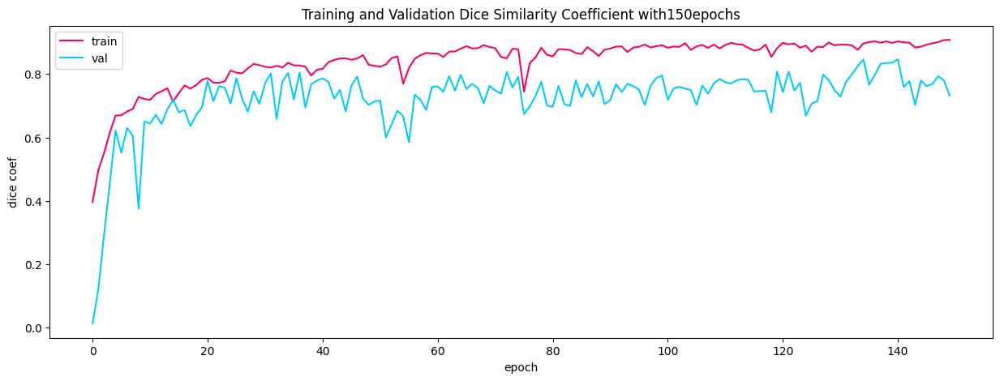

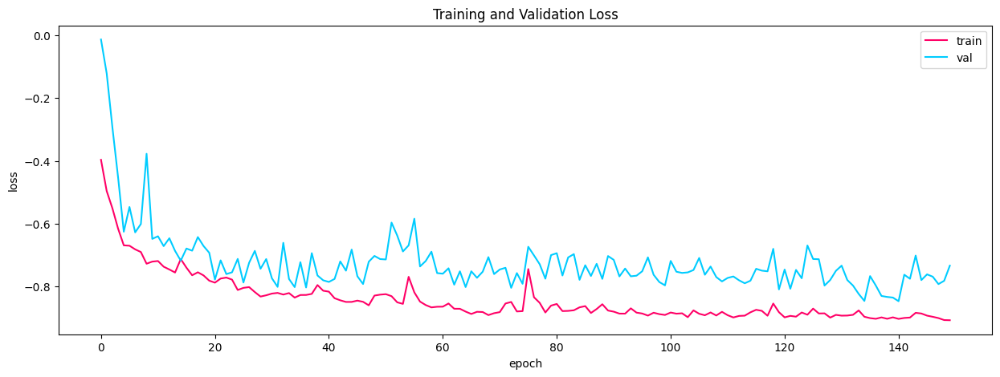

In [31]:
#-----------------------------------------------------------
# Retrieve a list of list results on training and validation data
# sets for each training epoch
#-----------------------------------------------------------
acc      = history_new_unet.history['dice_coef']
val_acc  = history_new_unet.history['val_dice_coef']
loss     = history_new_unet.history['loss']
val_loss = history_new_unet.history['val_loss']

epochs   = range(len(acc)) # Get number of epochs

#------------------------------------------------
# Plot training and validation accuracy per epoch
#------------------------------------------------
plt.figure(figsize=(15,5))
plt.plot  (epochs, acc, color = '#ff0066')
plt.plot  (epochs, val_acc, color = '#00ccff')
plt.title ('Training and Validation Dice Similarity Coefficient with'+str(EPOCHS)+'epochs')
plt.legend(['train', 'val'], loc='upper left')
plt.ylabel('dice coef')
plt.xlabel('epoch');

#------------------------------------------------
# Plot training and validation loss per epoch
#------------------------------------------------
plt.figure(figsize=(15,5))
plt.plot  (epochs, loss, color = '#ff0066')
plt.plot  (epochs, val_loss, color = '#00ccff')
plt.legend(['train', 'val'], loc='upper right')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.title ('Training and Validation Loss');

In [32]:
model = load_model('unet_new_brain_mri_seg.hdf5', custom_objects={'dice_coef_loss': dice_coef_loss, 'iou': iou, 'dice_coef': dice_coef})
results = model.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE)
print('Test loss: ', results[0])
print('Test IOU: ', results[2])
print('Test Dice Coefficent: ', results[3])

Found 418 validated image filenames.
Found 418 validated image filenames.
27/27 [==============================] - 6s 210ms/step - loss: -0.7969 - binary_accuracy: 0.9969 - iou: 0.6792 - dice_coef: 0.7973
Test loss:  -0.7968515157699585
Test IOU:  0.6791734099388123
Test Dice Coefficent:  0.7972553372383118


## Model Predictions

1/1 [==============================] - 1s 697ms/step


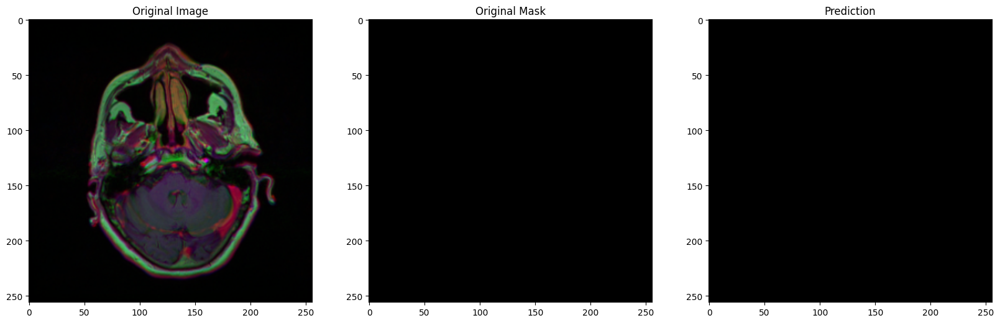

1/1 [==============================] - 0s 14ms/step


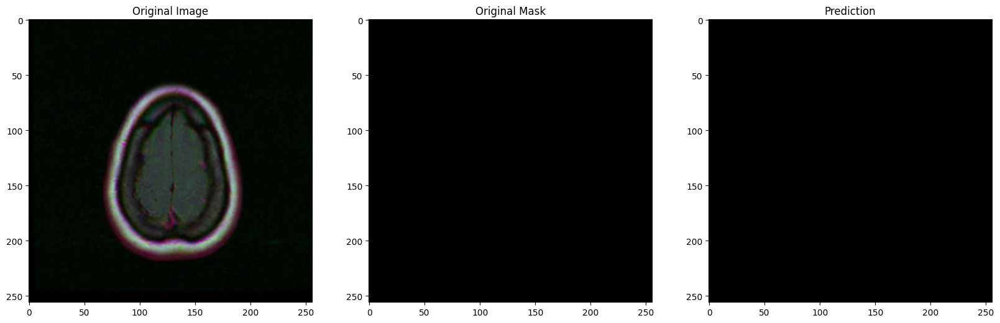

1/1 [==============================] - 0s 15ms/step


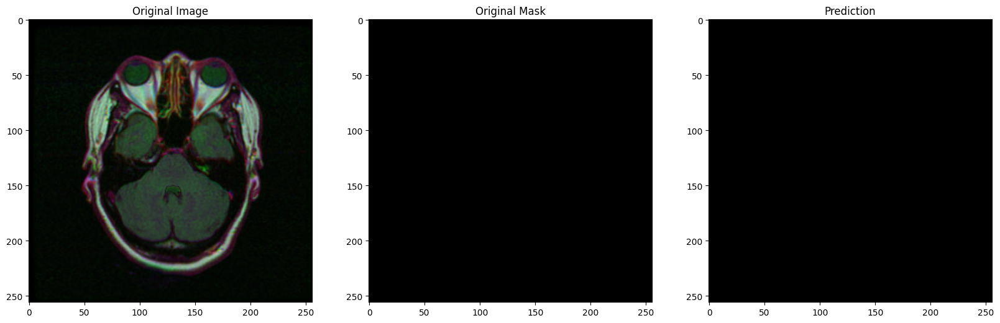

1/1 [==============================] - 0s 15ms/step


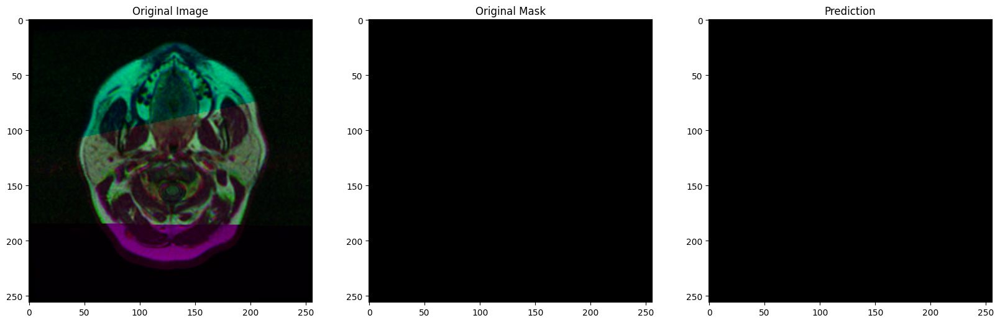

1/1 [==============================] - 0s 15ms/step


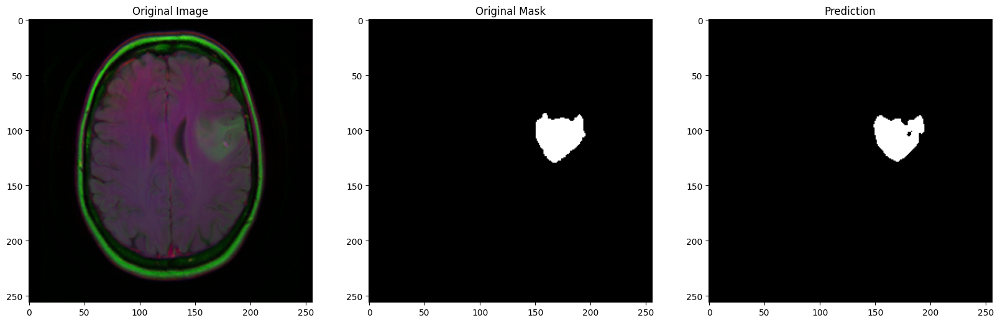

1/1 [==============================] - 0s 15ms/step


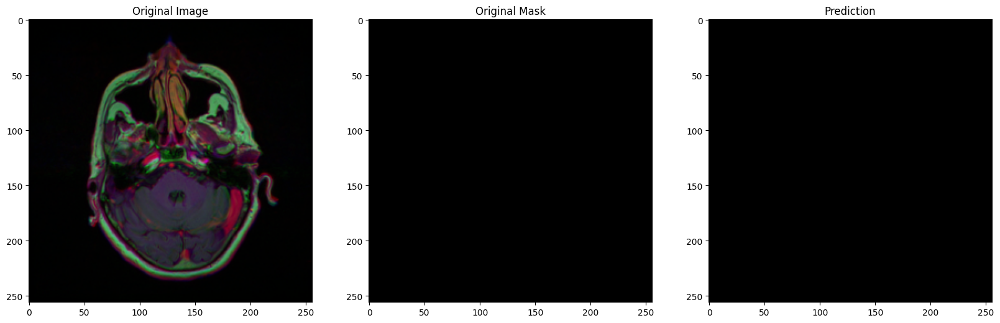

1/1 [==============================] - 0s 15ms/step


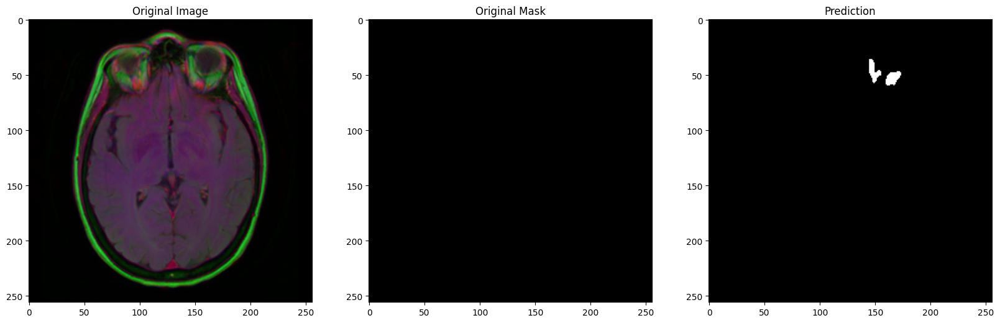

1/1 [==============================] - 0s 15ms/step


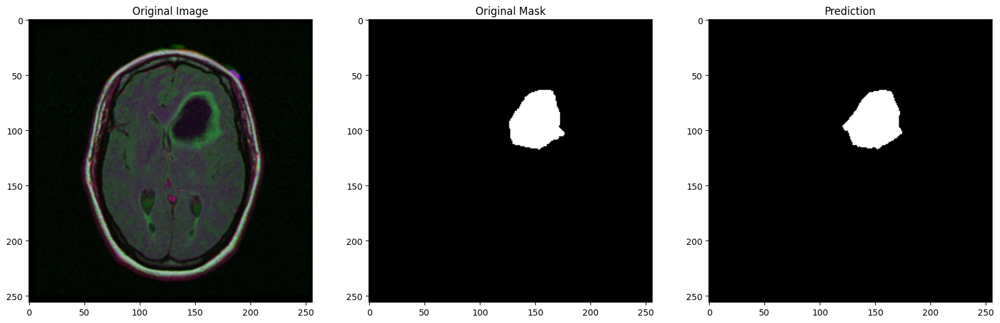

1/1 [==============================] - 0s 16ms/step


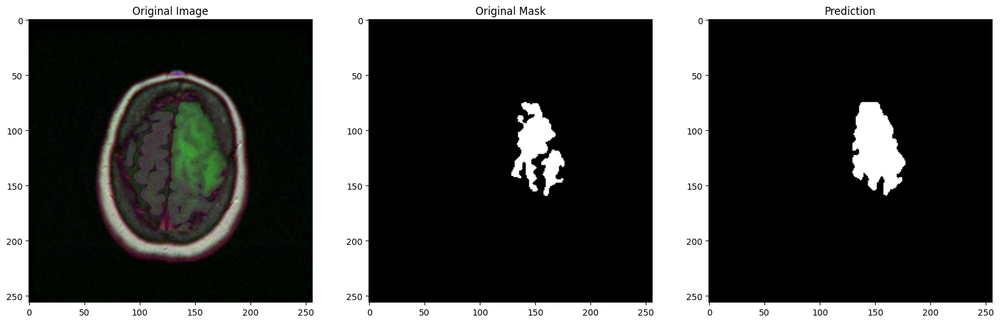

1/1 [==============================] - 0s 15ms/step


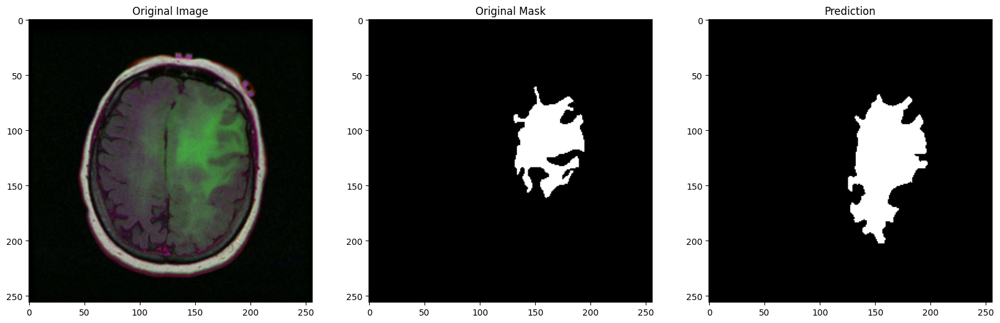

1/1 [==============================] - 0s 15ms/step


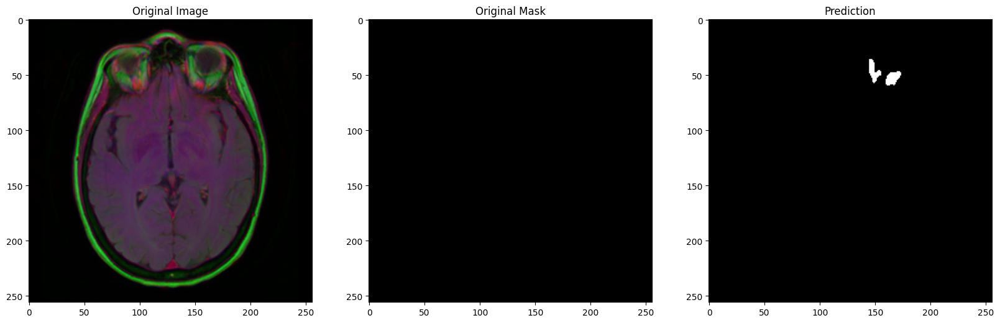

1/1 [==============================] - 0s 15ms/step


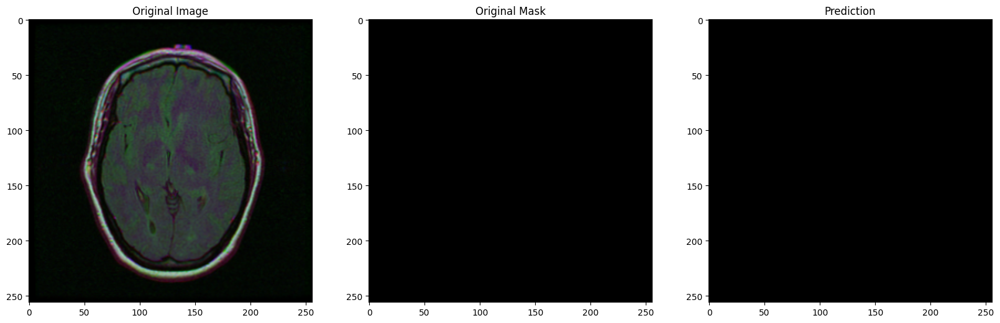

1/1 [==============================] - 0s 15ms/step


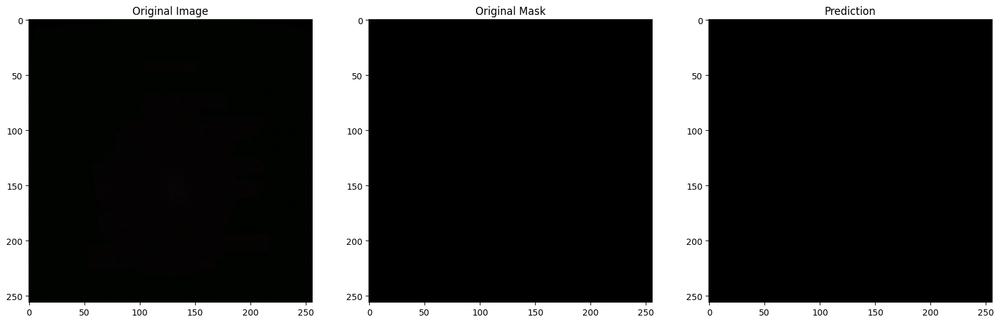

1/1 [==============================] - 0s 15ms/step


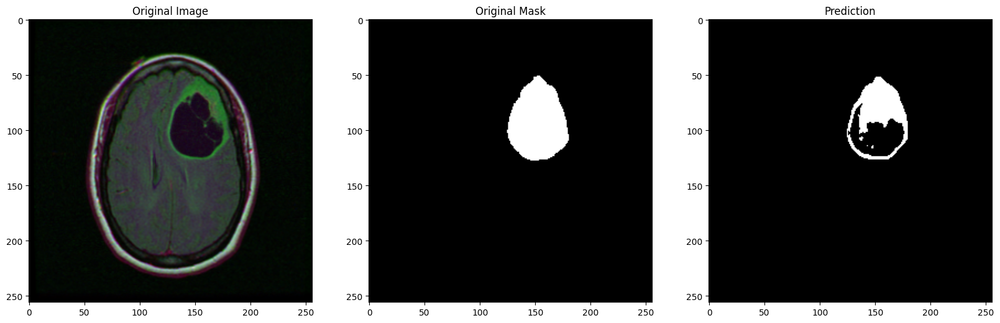

1/1 [==============================] - 0s 14ms/step


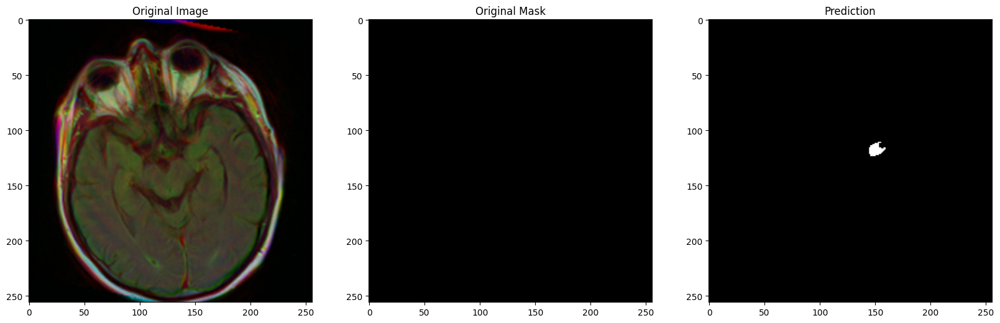

1/1 [==============================] - 0s 15ms/step


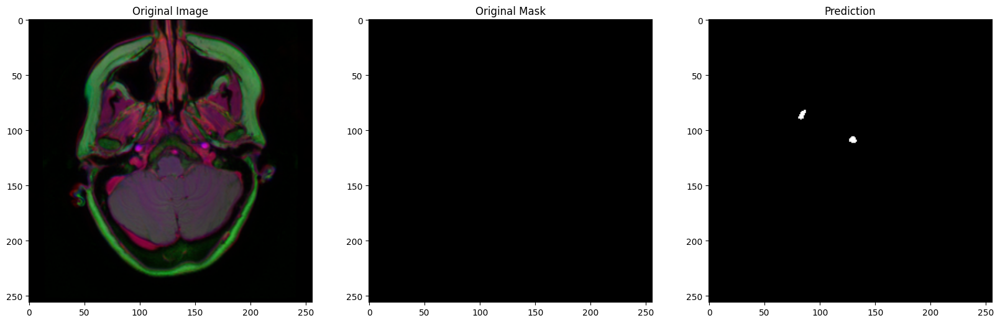

1/1 [==============================] - 0s 16ms/step


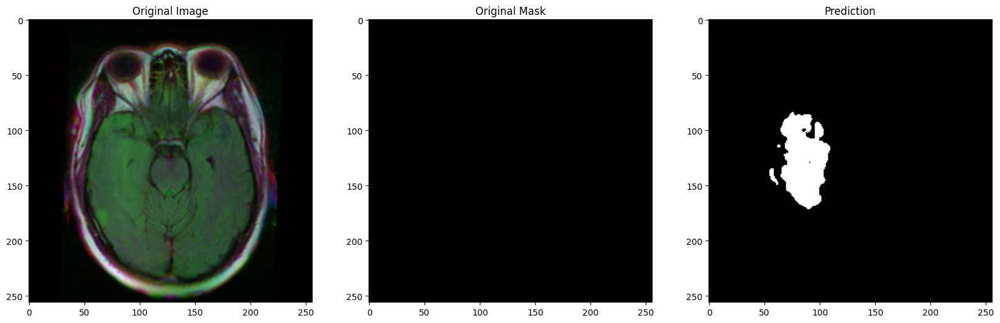

1/1 [==============================] - 0s 16ms/step


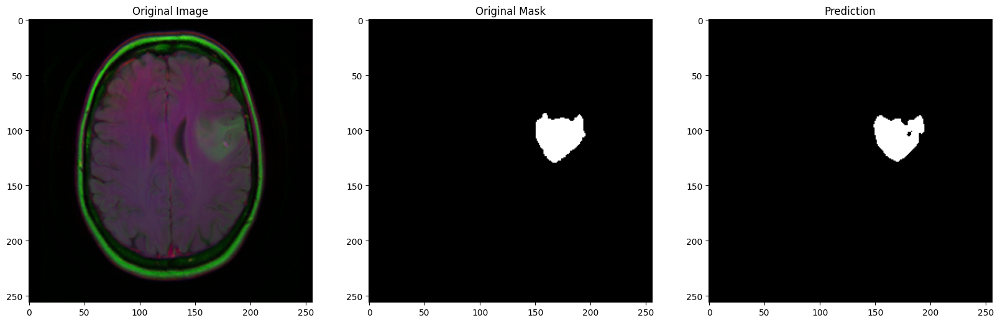

1/1 [==============================] - 0s 15ms/step


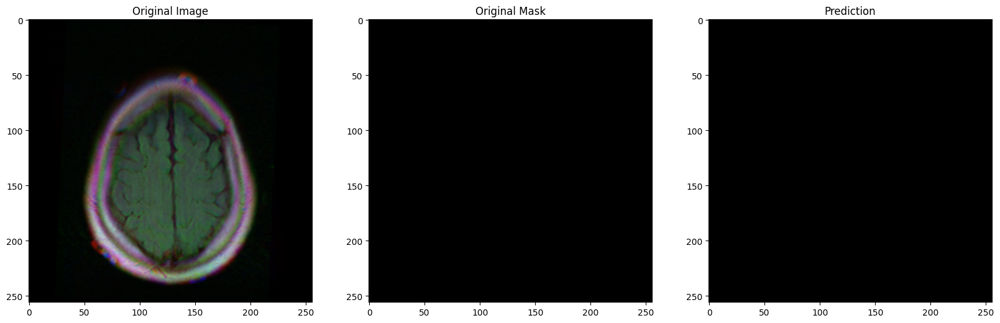

1/1 [==============================] - 0s 15ms/step


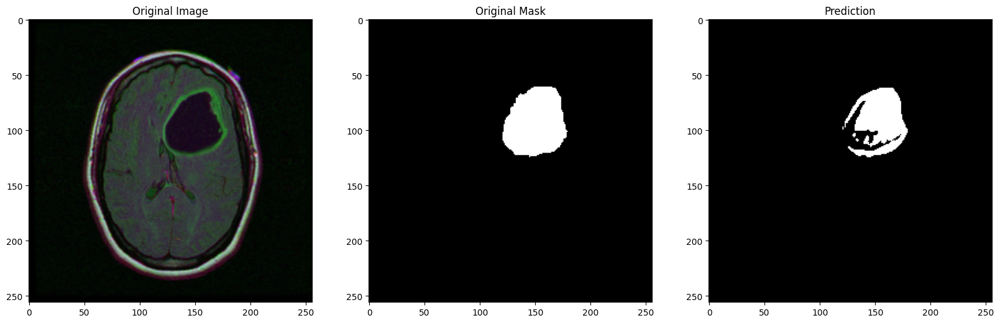

1/1 [==============================] - 0s 15ms/step


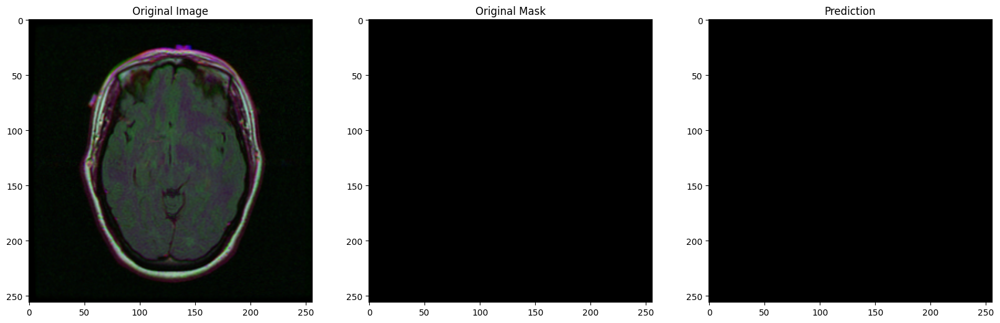

1/1 [==============================] - 0s 15ms/step


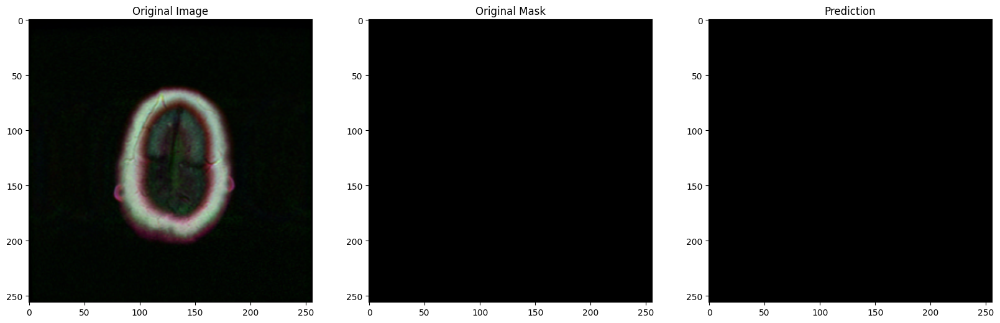

1/1 [==============================] - 0s 15ms/step


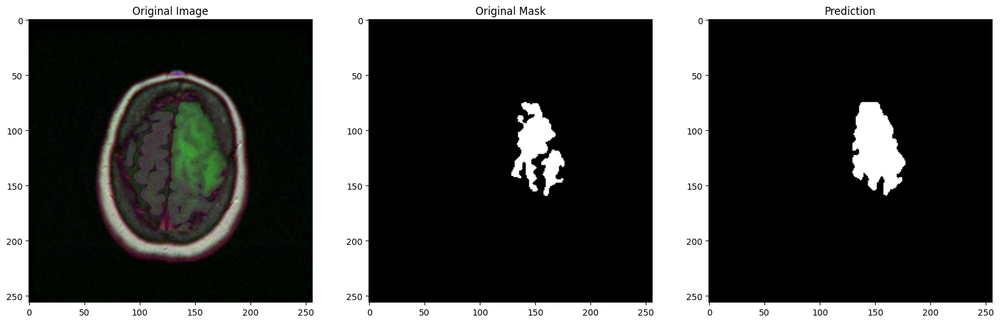

1/1 [==============================] - 0s 15ms/step


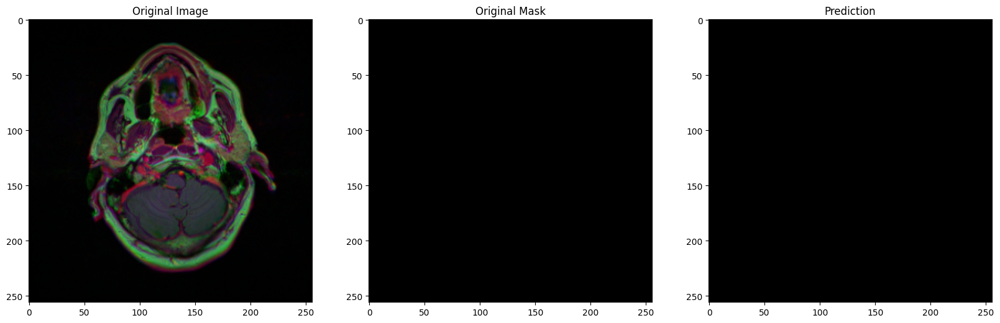

1/1 [==============================] - 0s 15ms/step


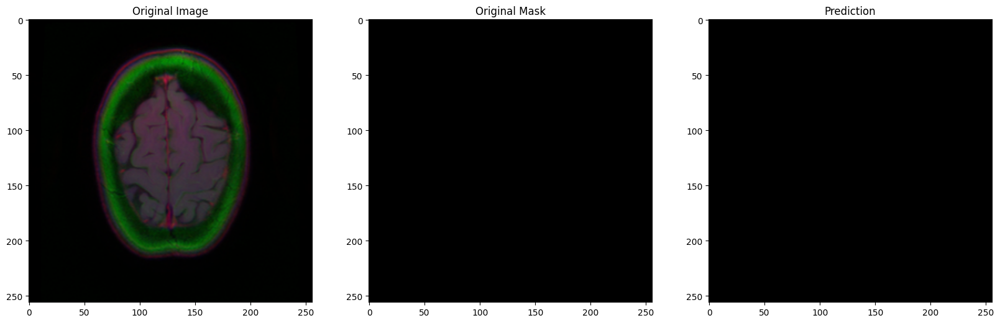

1/1 [==============================] - 0s 15ms/step


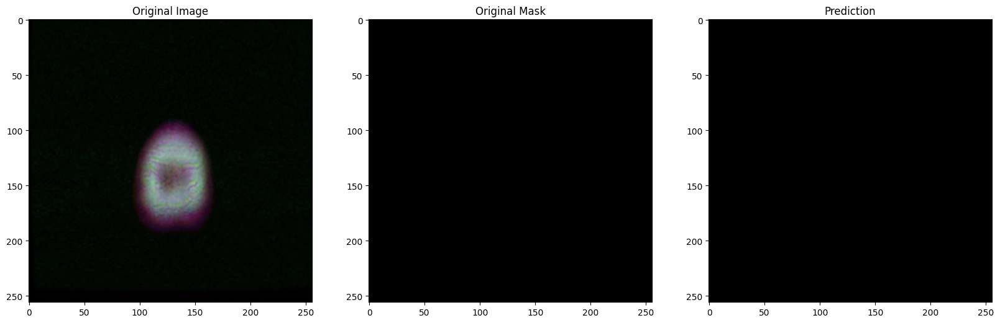

1/1 [==============================] - 0s 15ms/step


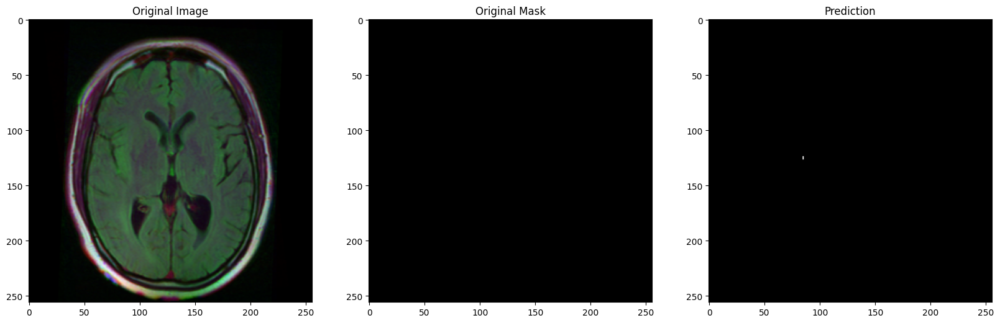

1/1 [==============================] - 0s 15ms/step


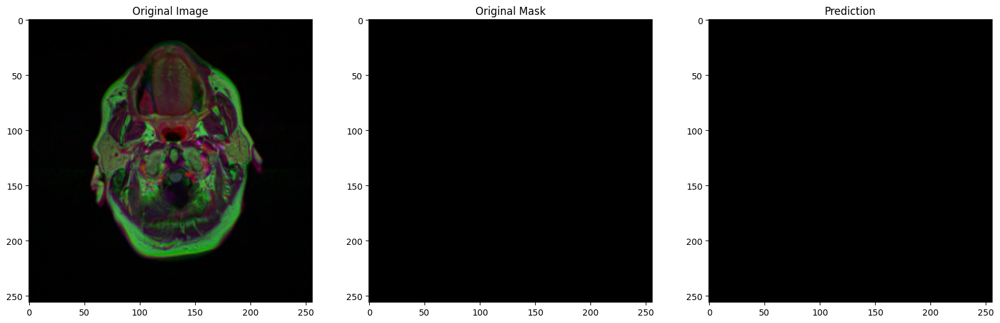

1/1 [==============================] - 0s 16ms/step


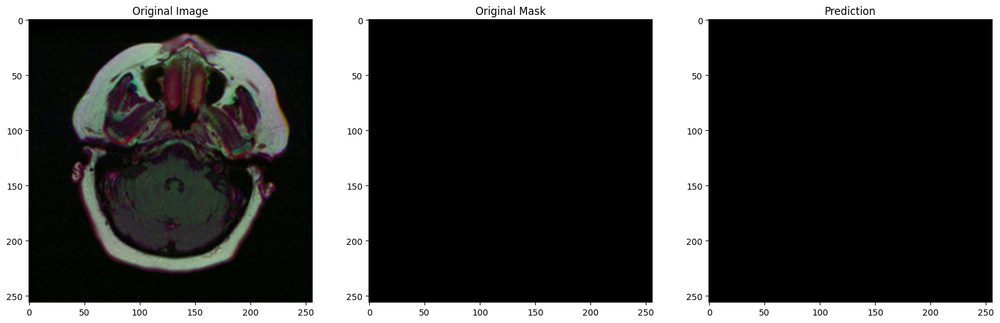

1/1 [==============================] - 0s 15ms/step


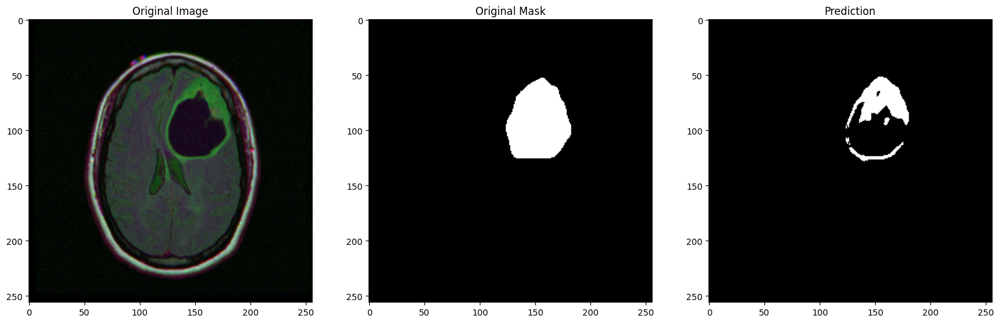

In [33]:
for i in range(30):
    index = np.random.randint(1,len(df_test.index))
    img = cv2.imread(df_test['filename'].iloc[index])
    img = cv2.resize(img ,(256, 256))
    img = img / 255
    img = img[np.newaxis, :, :, :]
    pred = model.predict(img)

    plt.figure(figsize=(20,50))
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(img))
    plt.title('Original Image')
    plt.subplot(1,3,2)
    plt.imshow(np.squeeze(cv2.imread(df_test['mask'].iloc[index])))
    plt.title('Original Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(pred) > .5, cmap = 'gray')
    plt.title('Prediction')
    plt.show()